# Homework 3

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import importlib
import copy
import sys 
sys.path.append("..")

# reload module in case that module changes
from lib import utils
importlib.reload(utils)
from lib import image_process
importlib.reload(image_process)

<module 'lib.image_process' from '..\\lib\\image_process.py'>

# 1.Harris角点检测

In [11]:
filename = 'img/example_02.jpg'
img = cv2.imread(filename)
# Harris角点检测函数
def har(img, block_size, ksize, alpha, threshold_factor):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    # 邻域窗口大小、Sobel滤波器大小、角点检测参数(0.04-0.06)
    dst = cv2.cornerHarris(gray,block_size,ksize,alpha)
    # dst = cv2.dilate(dst,None)
    # 选取阈值
    threshold = threshold_factor*dst.max()
    copy_img = copy.deepcopy(img)
    copy_img[dst>threshold]=[0,0,255]
    return copy_img

## 1.1 参数对角点检测的影响

### 1.1.1 邻域窗口大小

选取不同的观测窗口大小：1×1，3×3，5×5，7×7，9×9，11×11，观察其对角点检测的影响：

In [55]:
ksize, alpha, threshold_factor = 5, 0.05, 0.01

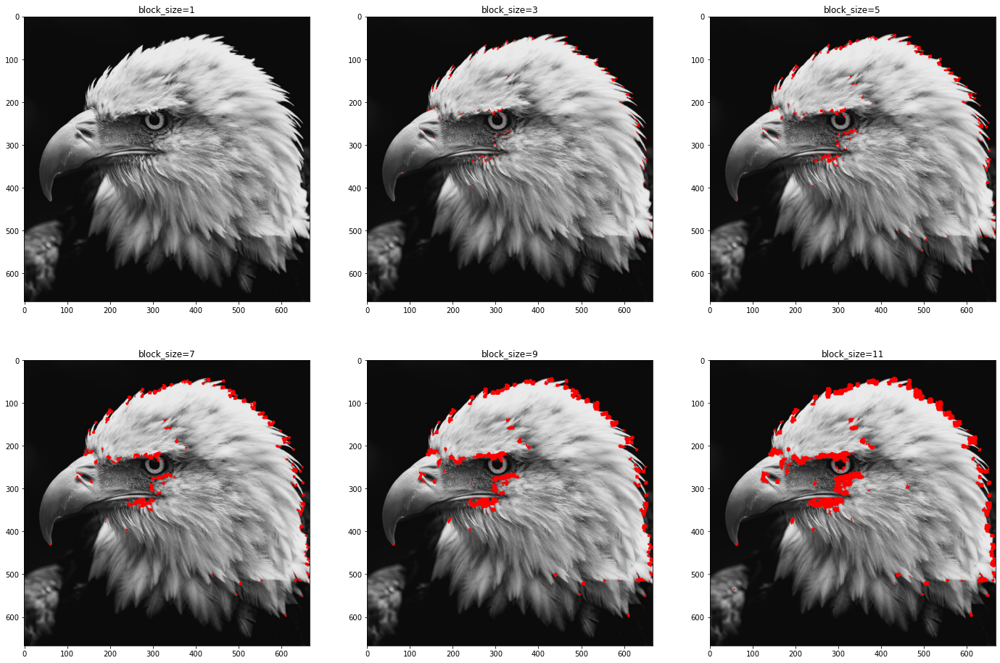

In [56]:
plt.figure(figsize=(24,16))

block_size = 1
plt.subplot(231)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
block_size = 3
plt.subplot(232)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
block_size = 5
plt.subplot(233)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
block_size = 7
plt.subplot(234)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
block_size = 9
plt.subplot(235)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
block_size = 11
plt.subplot(236)
plt.title('block_size={}'.format(block_size))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))

由上图可知，当检测窗口过小时，会丢失掉许多明显的角点；当检测窗口过大时，许多不是角点的点被确定为角点。因此，选择合适的检测窗口十分重要。

### 1.1.2 ksize大小

选取不同的Sobel滤波器核的大小，观察其对角点检测的影响：

In [58]:
block_size, alpha, threshold_factor = 5, 0.05, 0.01

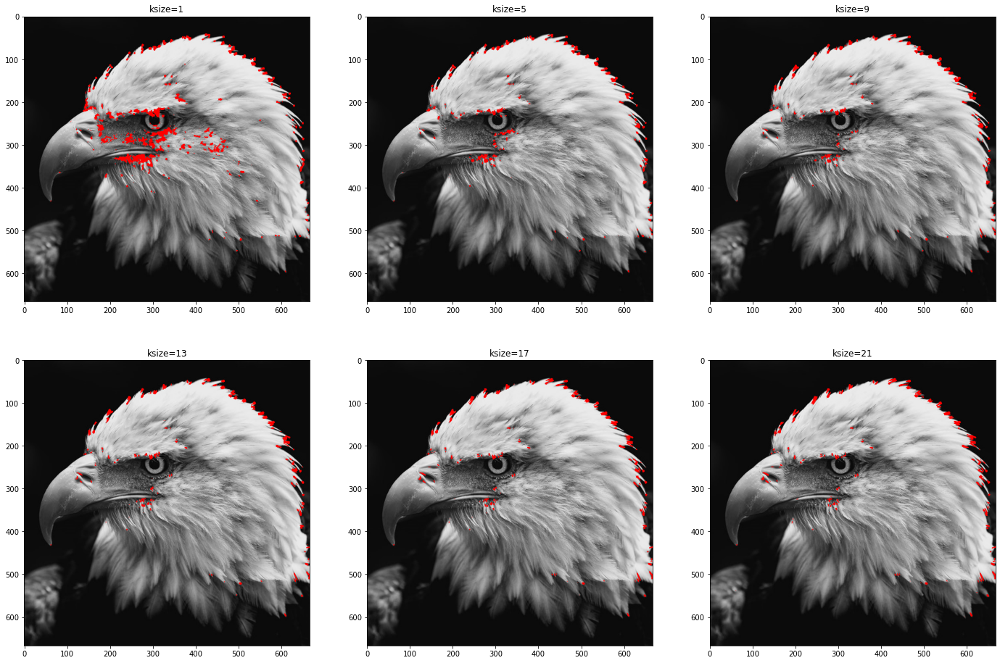

In [59]:
plt.figure(figsize=(24,16))

ksize = 1
plt.subplot(231)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
ksize = 5
plt.subplot(232)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
ksize = 9
plt.subplot(233)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
ksize = 13
plt.subplot(234)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
ksize = 17
plt.subplot(235)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
ksize = 21
plt.subplot(236)
plt.title('ksize={}'.format(ksize))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))

由上图可知，ksize对角点检测影响较小，不是该检测方法的关键参数。

### 1.1.3 阈值大小

每个点都有角点响应函数值，选取不同的阈值大小，来判断某个点是否为角点：

In [60]:
blocksize, ksize, alpha = 5, 5, 0.05

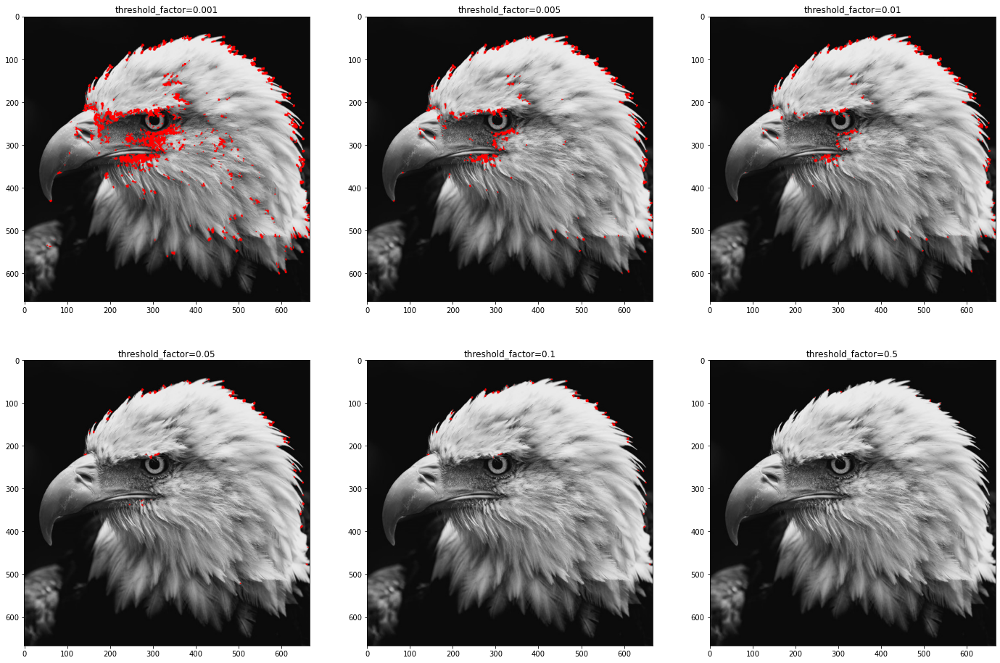

In [61]:
plt.figure(figsize=(24,16))

threshold_factor = 0.001
plt.subplot(231)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
threshold_factor = 0.005
plt.subplot(232)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
threshold_factor = 0.01
plt.subplot(233)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
threshold_factor = 0.05
plt.subplot(234)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
threshold_factor = 0.1
plt.subplot(235)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
threshold_factor = 0.5
plt.subplot(236)
plt.title('threshold_factor={}'.format(threshold_factor))
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))

由上图可知，阈值大小极大地影响角点检测结果，较大的阈值会过滤掉几乎所有点，而较小的阈值又会出现许多假阳性的角点。因此，需要根据实验结果选取恰当的阈值。

## 1.2 Harris角点检测的等变性与不变性

In [12]:
blocksize, ksize, alpha, threshold_factor = 5, 5, 0.05, 0.01

# 改变对比度和亮度
def contrast_and_brightness(alpha, beta, img):
    blank = np.zeros(img.shape, img.dtype)
    # dst = alpha * img + beta * blank
    dst = cv2.addWeighted(img, alpha, blank, 1-alpha, beta)
    return dst

# 图像的几何变换：平移，旋转，缩放
def transform(img, tx, ty, theta, scale):
    rows, cols = img.shape[:2]
    M = cv2.getRotationMatrix2D((cols/2, rows/2), theta, scale)
    M = M.dot(np.float32([[1, 0, tx], [0, 1, ty], [0,0,1]]))
    dst = cv2.warpAffine(img, M, (cols, rows))
    return dst

# 以透视变换代替微小形变
def deformation(img):
    rows, cols = img.shape[:2]
    pts1 = np.float32([[0,0], [600,0], [0,600], [600,600]])
    pts2 = np.float32([[100,100], [500,200], [0, 500], [620,620]])
    M = cv2.getPerspectiveTransform(pts1, pts2)
    res = cv2.warpPerspective(img, M, (cols, rows))
    return res


### 1.2.1 光度测量学变换

分别改变图像的对比度、亮度、对比度&亮度，观察Harris角点检测结果的变化：

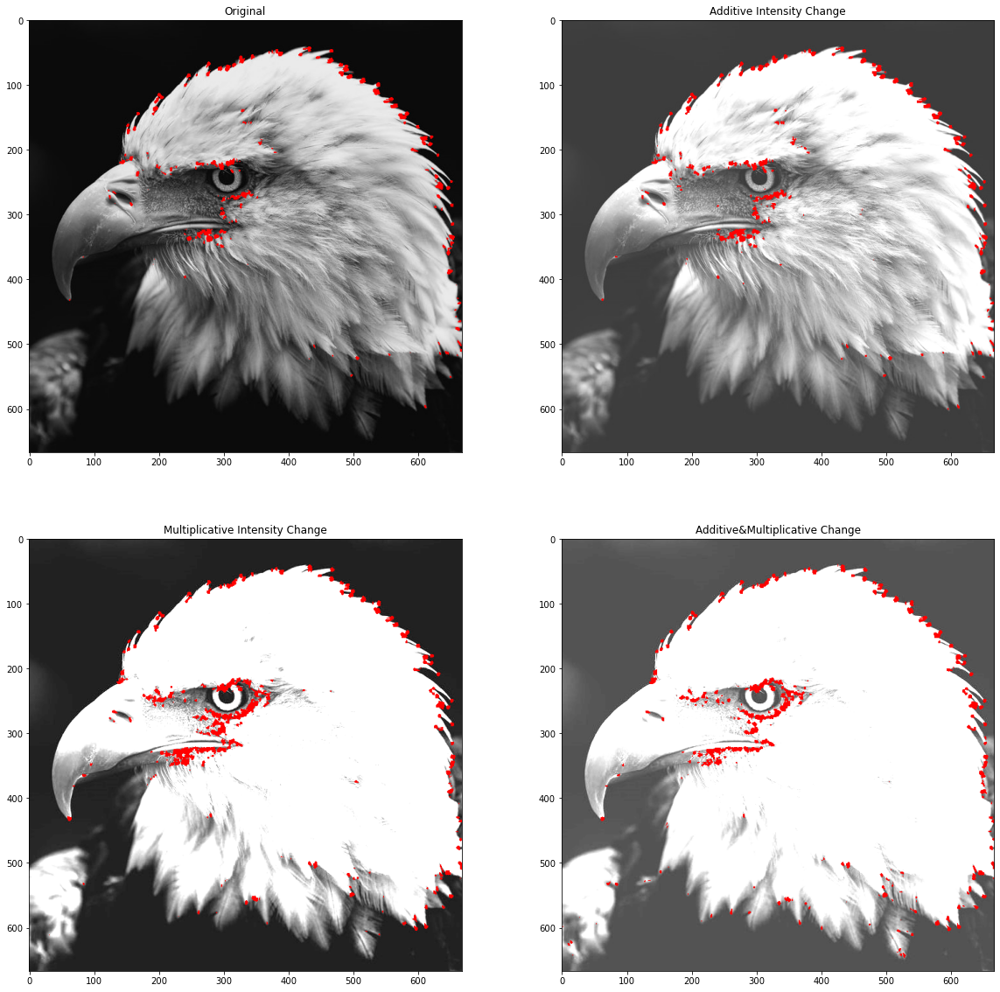

In [79]:
plt.figure(figsize=(20,20))

plt.subplot(221)
plt.title('Original')
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
plt.subplot(222)
plt.title('Additive Intensity Change')
utils.show_img(har(contrast_and_brightness(1, 50, img), block_size, ksize, alpha, threshold_factor))
plt.subplot(223)
plt.title('Multiplicative Intensity Change')
utils.show_img(har(contrast_and_brightness(3, 0, img), block_size, ksize, alpha, threshold_factor))
plt.subplot(224)
plt.title('Additive&Multiplicative Change')
utils.show_img(har(contrast_and_brightness(3, 50, img), block_size, ksize, alpha, threshold_factor))

通过对比可以发现，当改变图像的亮度时($I'=I+\beta$)时，检测结果基本无变化；当改变图像的对比度($I'=\alpha I$)时，检测结果发生明显变化。

这说明Harris角点检测对亮度变化具有不变性，对对比度变化不具有不变性。

### 1.2.2 平移和旋转变换

分别平移旋转图片，观察检测结果：

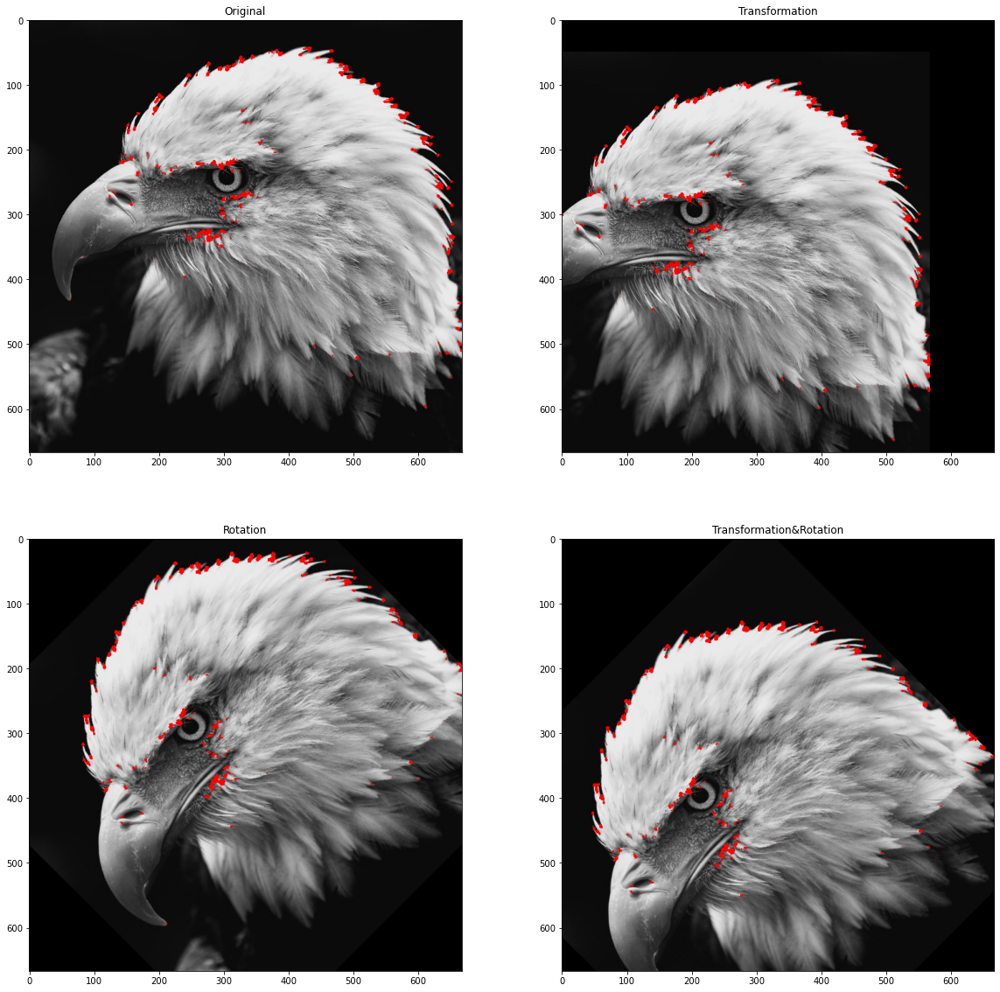

In [94]:
plt.figure(figsize=(20,20))

plt.subplot(221)
plt.title('Original')
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
plt.subplot(222)
plt.title('Transformation')
tx, ty, theta, scale = -100, 50, 0, 1
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))
plt.subplot(223)
plt.title('Rotation')
tx, ty, theta, scale = 0, 0, 45, 1
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))
plt.subplot(224)
plt.title('Transformation&Rotation')
tx, ty, theta, scale = -100, 50, 45, 1
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))

通过观察，无论是平移还是旋转，检测结果基本都无变化，因此Harris角点检测对平移旋转的几何变换具有不变性和等变性。

### 1.2.3 尺度变换

分别缩小、放大图片，观察检测结果的变化：

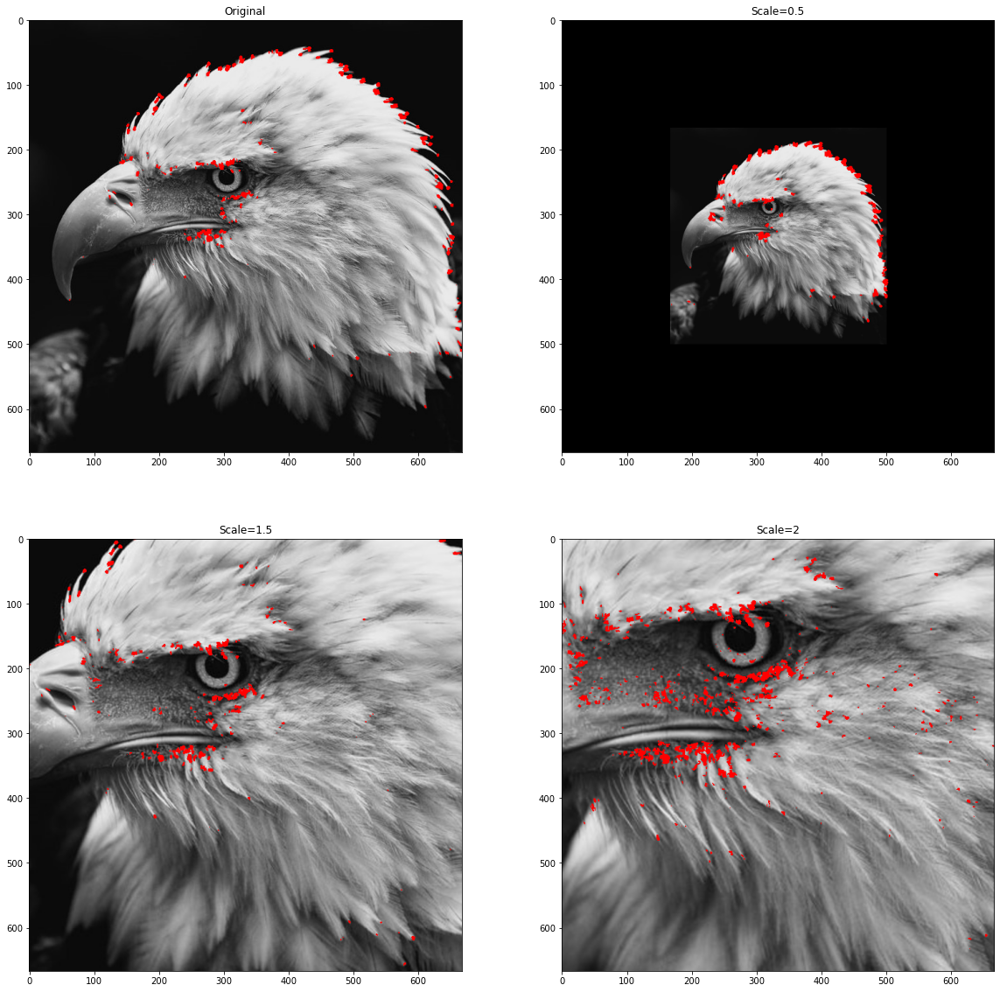

In [97]:
plt.figure(figsize=(20,20))
tx, ty, theta = 0, 0, 0

plt.subplot(221)
plt.title('Original')
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
scale = 0.5
plt.subplot(222)
plt.title('Scale={}'.format(scale))
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))
scale = 1.5
plt.subplot(223)
plt.title('Scale={}'.format(scale))
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))
scale = 2
plt.subplot(224)
plt.title('Scale={}'.format(scale))
utils.show_img(har(transform(img, tx, ty, theta, scale), block_size, ksize, alpha, threshold_factor))

通过比较发现，图像的尺度变化极大地影响检测结果。因此，Harris角点检测对尺度变化不具有不变性。

### 1.2.4 微小形变

对图片做一些微小的形变，观察检测结果：

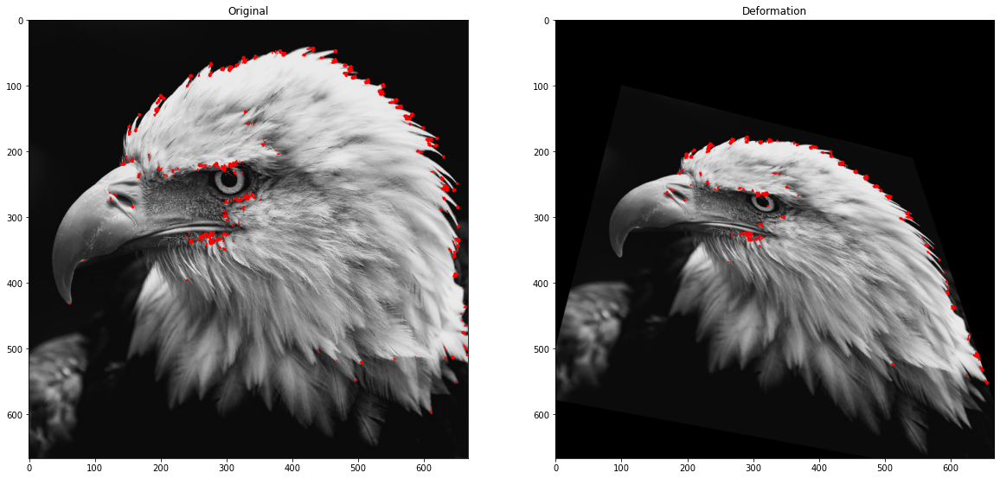

In [126]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title('Original')
utils.show_img(har(img, block_size, ksize, alpha, threshold_factor))
plt.subplot(122)
plt.title('Deformation')
utils.show_img(har(deformation(img), block_size, ksize, alpha, threshold_factor))

通过观察发现，Harris角点检测对微小形变也较为敏感，不具有不变性。

# 2. SIFT特征描述子的等变性和不变性

In [4]:
filename = 'img/example_02.jpg'
img = cv2.imread(filename)
def sift(img):
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    kp = sift.detect(gray,None)
    res = cv2.drawKeypoints(gray,kp,img)
    return res

通过以下的实验，我们发现无论是哪种形式的变换，SIFT描述子都能保持很好的不变性和等变性。

## 2.1 光度测量学变换

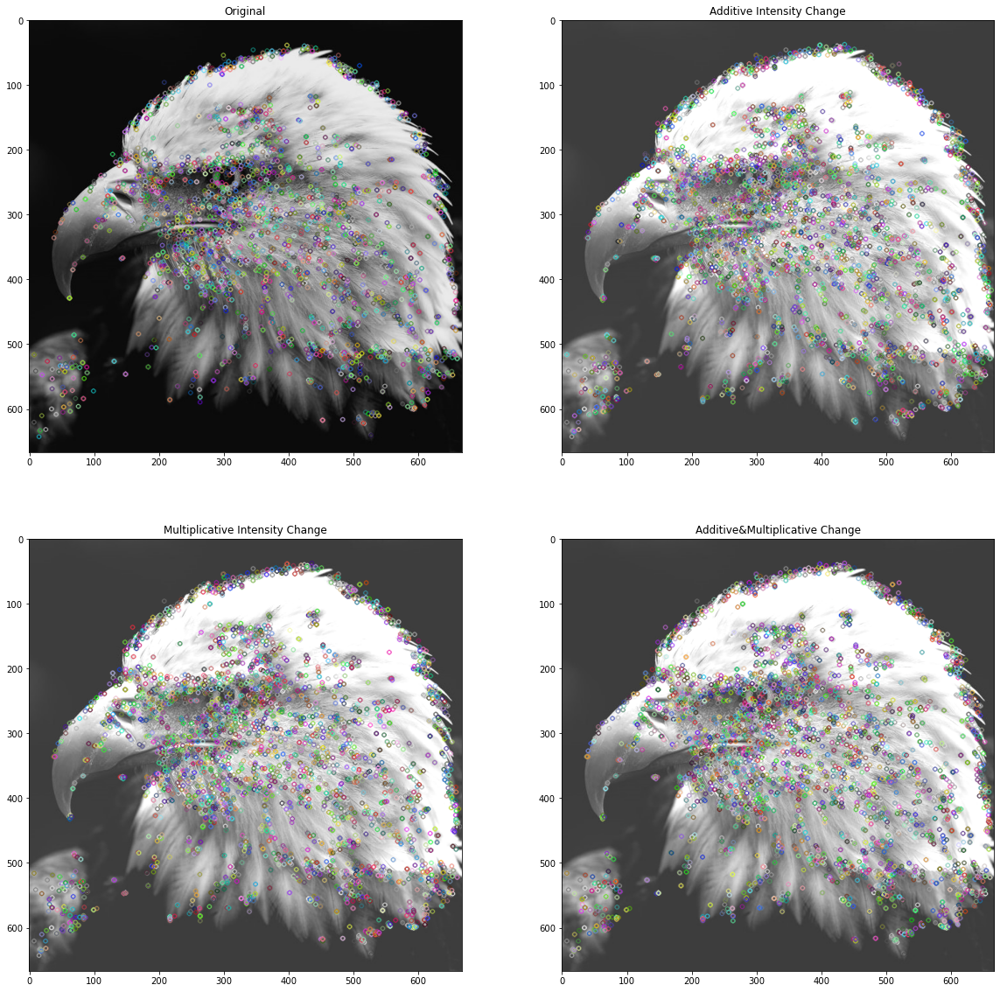

In [7]:
plt.figure(figsize=(20,20))

plt.subplot(221)
plt.title('Original')
utils.show_img(sift(img))
plt.subplot(222)
plt.title('Additive Intensity Change')
utils.show_img(sift(contrast_and_brightness(1, 50, img)))
plt.subplot(223)
plt.title('Multiplicative Intensity Change')
utils.show_img(sift(contrast_and_brightness(1, 50, img)))
plt.subplot(224)
plt.title('Additive&Multiplicative Change')
utils.show_img(sift(contrast_and_brightness(1, 50, img)))

## 2.2 平移旋转变换

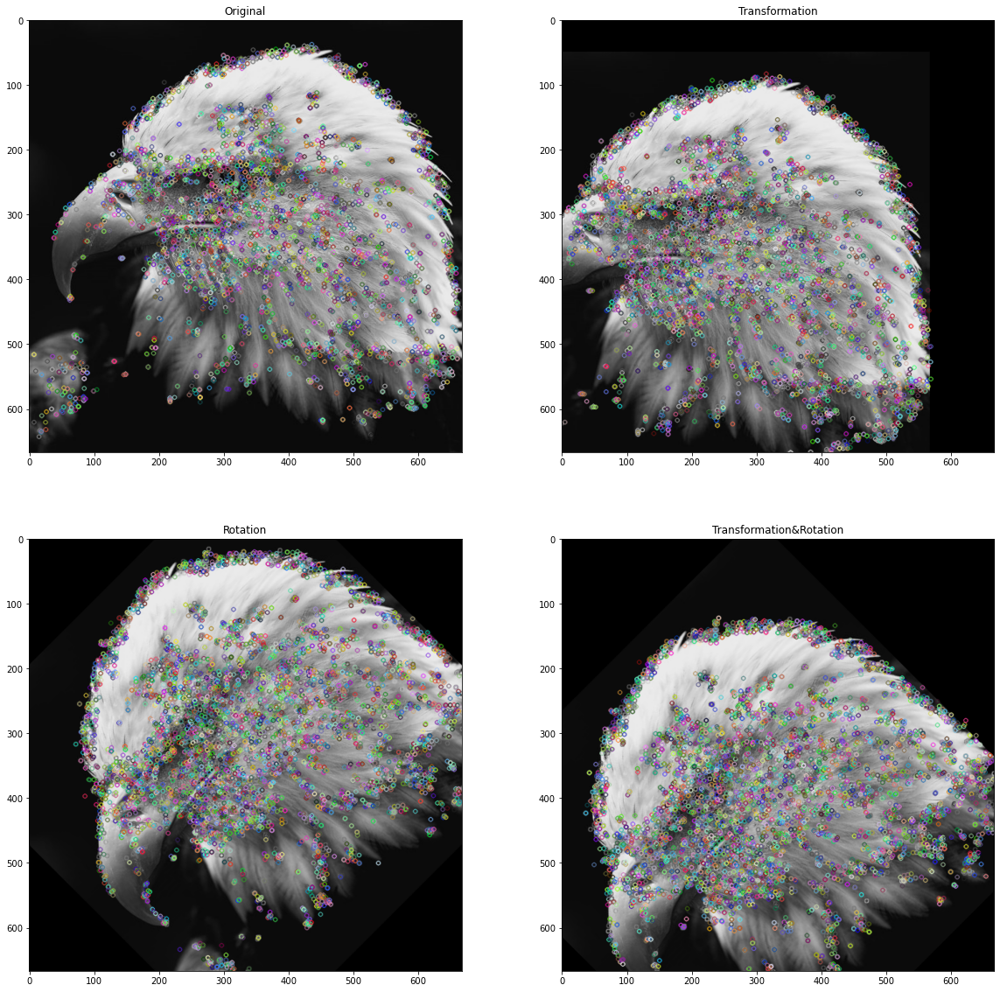

In [8]:
plt.figure(figsize=(20,20))

plt.subplot(221)
plt.title('Original')
utils.show_img(sift(img))
plt.subplot(222)
plt.title('Transformation')
tx, ty, theta, scale = -100, 50, 0, 1
utils.show_img(sift(transform(img, tx, ty, theta, scale)))
plt.subplot(223)
plt.title('Rotation')
tx, ty, theta, scale = 0, 0, 45, 1
utils.show_img(sift(transform(img, tx, ty, theta, scale)))
plt.subplot(224)
plt.title('Transformation&Rotation')
tx, ty, theta, scale = -100, 50, 45, 1
utils.show_img(sift(transform(img, tx, ty, theta, scale)))

## 2.3 尺度变换

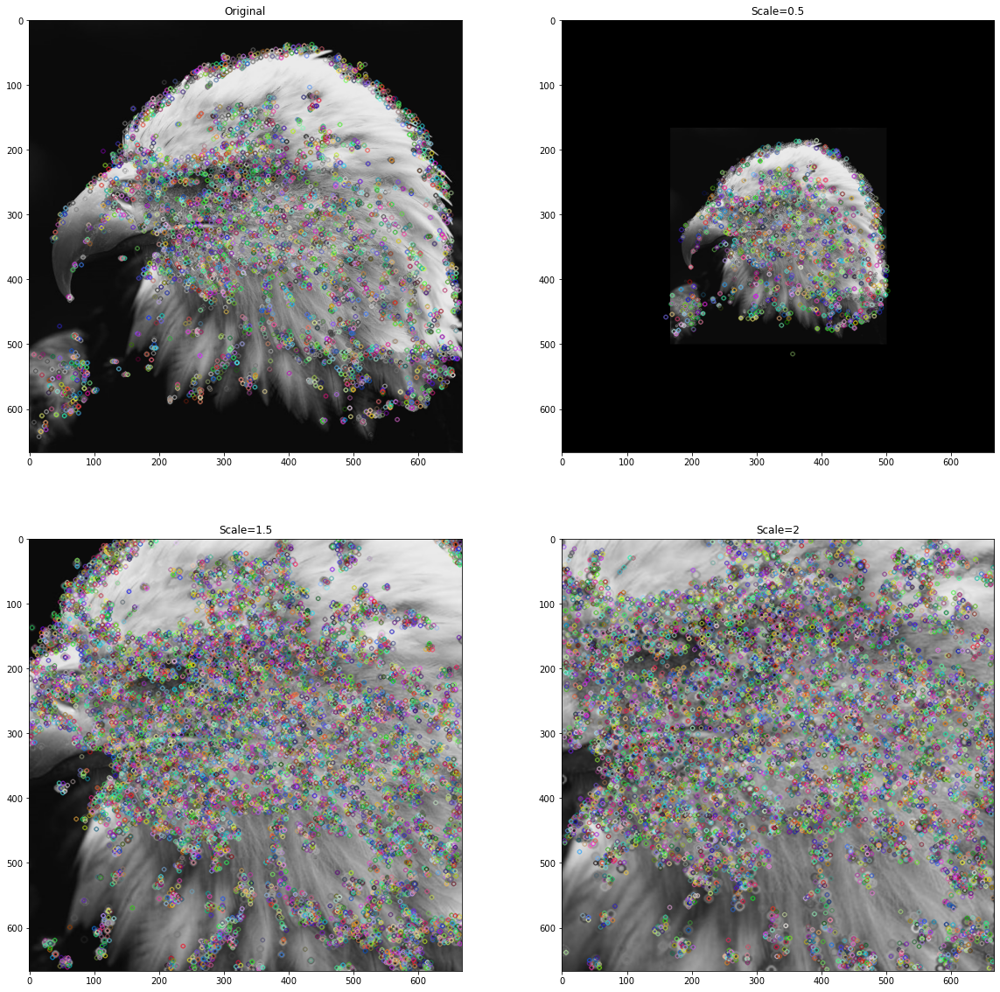

In [9]:
plt.figure(figsize=(20,20))
tx, ty, theta = 0, 0, 0

plt.subplot(221)
plt.title('Original')
utils.show_img(sift(img))
scale = 0.5
plt.subplot(222)
plt.title('Scale={}'.format(scale))
utils.show_img(sift(transform(img, tx, ty, theta, scale)))
scale = 1.5
plt.subplot(223)
plt.title('Scale={}'.format(scale))
utils.show_img(sift(transform(img, tx, ty, theta, scale)))
scale = 2
plt.subplot(224)
plt.title('Scale={}'.format(scale))
utils.show_img(sift(transform(img, tx, ty, theta, scale)))

## 2.4 微小形变

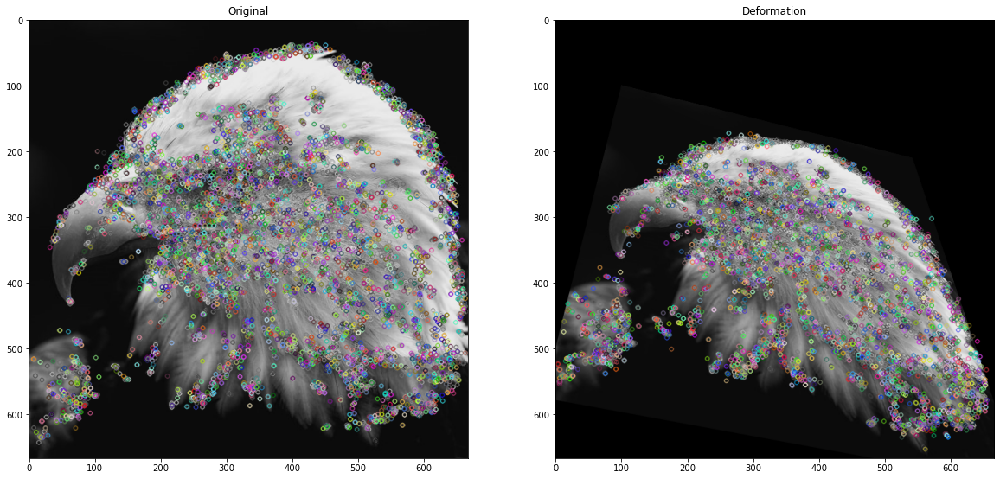

In [10]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title('Original')
utils.show_img(sift(img))
plt.subplot(122)
plt.title('Deformation')
utils.show_img(sift(deformation(img)))